## Josh Cubero
## Assignment 4

In [1]:
import warnings
warnings.filterwarnings("ignore")
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
import pandas as pd
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
#nltk.download('stopwords')
#nltk.download('punkt')

In [2]:
full_data = pd.read_csv('hw5_data_train.csv', index_col=None)

In [5]:
full_data.head(2)

,Title,Review,Recommended
0,Beautiful unique dress,Wore this to my sons wedding. found it last mi...,1
1,Had high hopes but...,"Gals, if you absolutely must have this top wai...",0


In [97]:
full_data.dropna(inplace=True)

In [98]:
partial_data = full_data.drop('Recommended', axis=1)
partial_data.dropna(inplace=True)

In [51]:
vectorizer1 = CountVectorizer()
vectorizer2 = CountVectorizer()
vectorizer3 = CountVectorizer()
vector_title = vectorizer1.fit_transform(partial_data['Title'])
vector_review = vectorizer2.fit_transform(partial_data['Review'])
vector_title_review = vectorizer3.fit_transform(partial_data['Title'].str.cat(partial_data['Review']))
vector_concatenated = np.concatenate((vector_title.toarray(), vector_review.toarray()), axis=1)

# Task 1 Title and Body 

## Use the title only

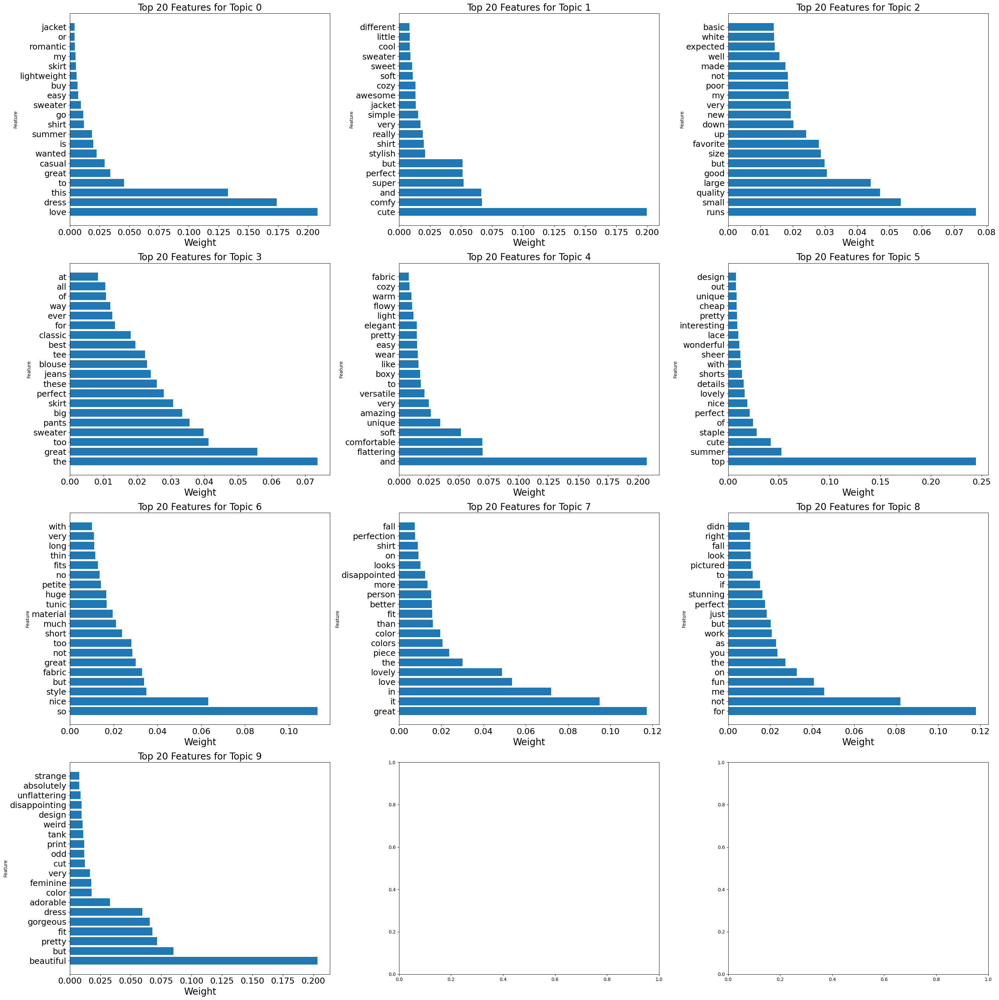

In [52]:
lda_title = LatentDirichletAllocation()
lda_title.fit(vector_title)
title_features = vectorizer1.get_feature_names_out()
topic_word_distributions = lda_title.components_ / lda_title.components_.sum(axis=1)[:, np.newaxis]
n_top_words = 20  
n_rows = 4  
n_cols = 3  

fig, axes = plt.subplots(n_rows, n_cols, figsize=(30, 30))
for topic_idx, (topic, ax) in enumerate(zip(topic_word_distributions, axes.flatten())):
    top_features_idx = topic.argsort()[::-1][:n_top_words]
    top_features = [title_features[i] for i in top_features_idx]
    top_weights = topic[top_features_idx]
    ax.barh(top_features, top_weights)
    ax.set_xlabel('Weight', fontsize=20)
    ax.set_ylabel('Feature')
    ax.set_title(f'Top {n_top_words} Features for Topic {topic_idx}',fontsize=20)
    ax.tick_params(axis='both', which='major', labelsize=18)
plt.tight_layout()
plt.show()

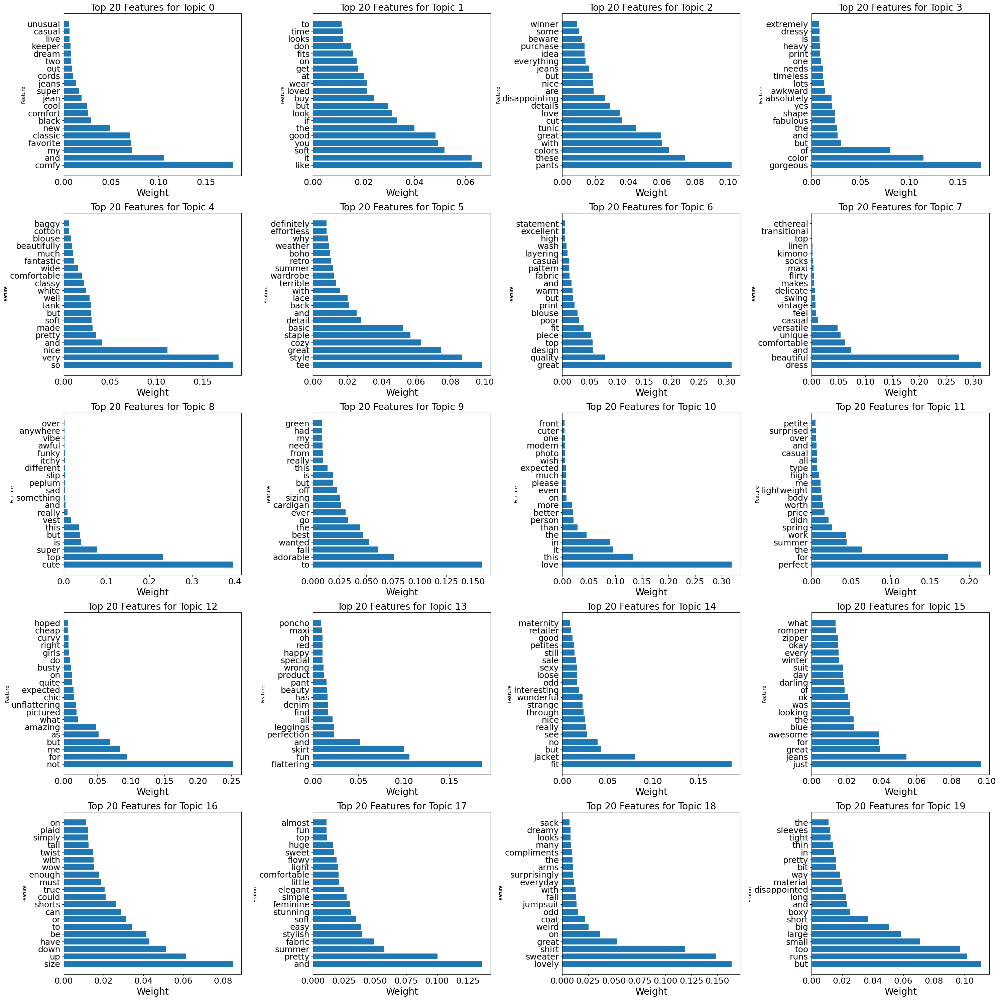

In [53]:
lda_title = LatentDirichletAllocation(n_components=20, learning_decay=0.01, batch_size=64)
lda_title.fit(vector_title)
title_features = vectorizer1.get_feature_names_out()
topic_word_distributions = lda_title.components_ / lda_title.components_.sum(axis=1)[:, np.newaxis]
n_top_words = 20  
n_rows = 5  
n_cols = 4  

fig, axes = plt.subplots(n_rows, n_cols, figsize=(30, 30))
for topic_idx, (topic, ax) in enumerate(zip(topic_word_distributions, axes.flatten())):
    top_features_idx = topic.argsort()[::-1][:n_top_words]
    top_features = [title_features[i] for i in top_features_idx]
    top_weights = topic[top_features_idx]
    ax.barh(top_features, top_weights)
    ax.set_xlabel('Weight', fontsize=20)
    ax.set_ylabel('Feature')
    ax.set_title(f'Top {n_top_words} Features for Topic {topic_idx}',fontsize=20)
    ax.tick_params(axis='both', which='major', labelsize=18)
plt.tight_layout()
plt.show()

In [22]:
"""lda_review = LatentDirichletAllocation()
lda_review.fit(vector_review)
title_features2 = vectorizer2.get_feature_names_out()
topic_word_distributions2 = lda_review.components_ / lda_review.components_.sum(axis=1)[:, np.newaxis]
n_top_words = 20  
n_rows = 4  
n_cols = 3  

fig, axes = plt.subplots(n_rows, n_cols, figsize=(30, 30))
for topic_idx, (topic, ax) in enumerate(zip(topic_word_distributions2, axes.flatten())):
    top_features_idx = topic.argsort()[::-1][:n_top_words]
    top_features = [title_features2[i] for i in top_features_idx]
    top_weights = topic[top_features_idx]
    ax.barh(top_features, top_weights)
    ax.set_xlabel('Weight', fontsize=20)
    ax.set_ylabel('Feature')
    ax.set_title(f'Top {n_top_words} Features for Topic {topic_idx}',fontsize=20)
    ax.tick_params(axis='both', which='major', labelsize=18)
plt.tight_layout()
plt.show()"""

"lda_review = LatentDirichletAllocation()\nlda_review.fit(vector_review)\ntitle_features2 = vectorizer2.get_feature_names_out()\ntopic_word_distributions2 = lda_review.components_ / lda_review.components_.sum(axis=1)[:, np.newaxis]\nn_top_words = 20  \nn_rows = 4  \nn_cols = 3  \n\nfig, axes = plt.subplots(n_rows, n_cols, figsize=(30, 30))\nfor topic_idx, (topic, ax) in enumerate(zip(topic_word_distributions2, axes.flatten())):\n    top_features_idx = topic.argsort()[::-1][:n_top_words]\n    top_features = [title_features2[i] for i in top_features_idx]\n    top_weights = topic[top_features_idx]\n    ax.barh(top_features, top_weights)\n    ax.set_xlabel('Weight', fontsize=20)\n    ax.set_ylabel('Feature')\n    ax.set_title(f'Top {n_top_words} Features for Topic {topic_idx}',fontsize=20)\n    ax.tick_params(axis='both', which='major', labelsize=18)\nplt.tight_layout()\nplt.show()"

In [23]:
"""lda_review2 = LatentDirichletAllocation(n_components=6, learning_decay=0.01, batch_size=64)
lda_review2.fit(vector_review)
title_features2 = vectorizer2.get_feature_names_out()
topic_word_distributions2 = lda_review2.components_ / lda_review2.components_.sum(axis=1)[:, np.newaxis]
n_top_words = 20  
n_rows = 2  
n_cols = 3  

fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 20))
for topic_idx, (topic, ax) in enumerate(zip(topic_word_distributions2, axes.flatten())):
    top_features_idx = topic.argsort()[::-1][:n_top_words]
    top_features = [title_features2[i] for i in top_features_idx]
    top_weights = topic[top_features_idx]
    ax.barh(top_features, top_weights)
    ax.set_xlabel('Weight', fontsize=20)
    ax.set_ylabel('Feature')
    ax.set_title(f'Top {n_top_words} Features for Topic {topic_idx}',fontsize=20)
    ax.tick_params(axis='both', which='major', labelsize=18)
plt.tight_layout()
plt.show()"""

"lda_review2 = LatentDirichletAllocation(n_components=6, learning_decay=0.01, batch_size=64)\nlda_review2.fit(vector_review)\ntitle_features2 = vectorizer2.get_feature_names_out()\ntopic_word_distributions2 = lda_review2.components_ / lda_review2.components_.sum(axis=1)[:, np.newaxis]\nn_top_words = 20  \nn_rows = 2  \nn_cols = 3  \n\nfig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 20))\nfor topic_idx, (topic, ax) in enumerate(zip(topic_word_distributions2, axes.flatten())):\n    top_features_idx = topic.argsort()[::-1][:n_top_words]\n    top_features = [title_features2[i] for i in top_features_idx]\n    top_weights = topic[top_features_idx]\n    ax.barh(top_features, top_weights)\n    ax.set_xlabel('Weight', fontsize=20)\n    ax.set_ylabel('Feature')\n    ax.set_title(f'Top {n_top_words} Features for Topic {topic_idx}',fontsize=20)\n    ax.tick_params(axis='both', which='major', labelsize=18)\nplt.tight_layout()\nplt.show()"

# Review Body Only

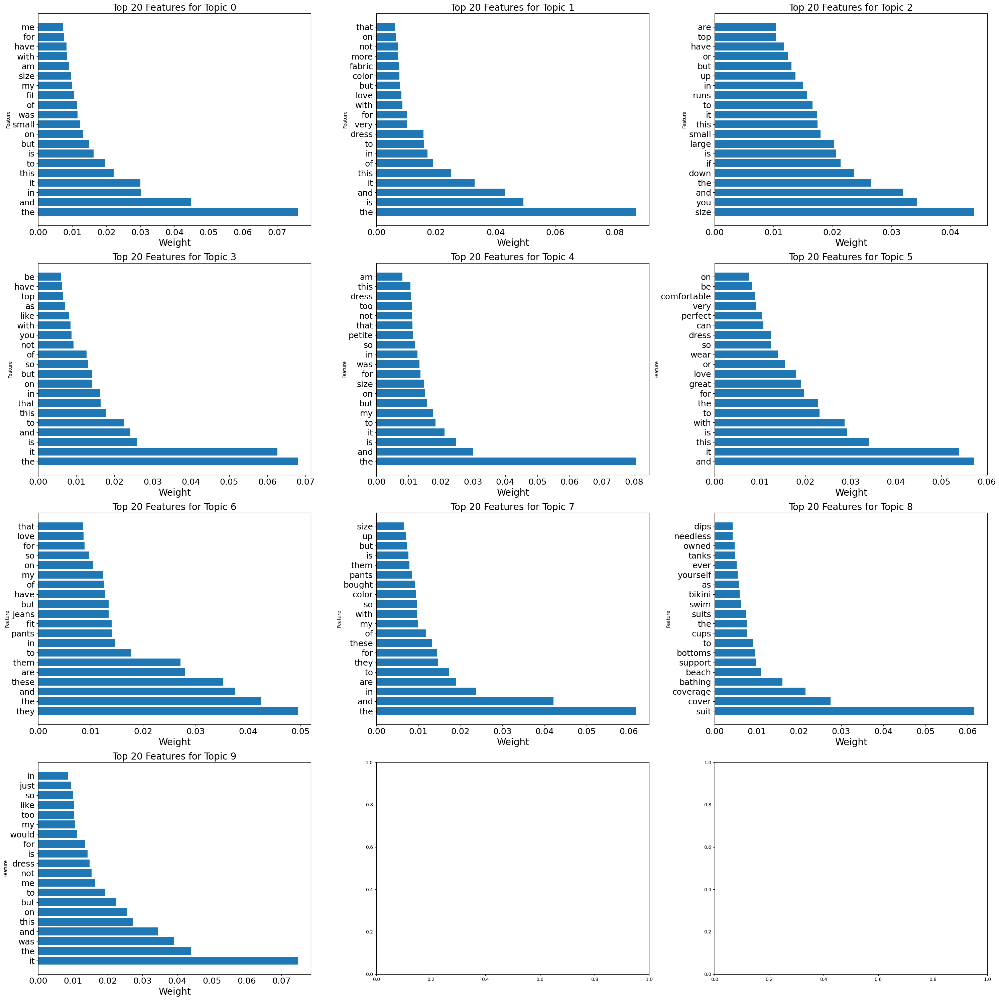

In [54]:
lda_review = LatentDirichletAllocation()
lda_review.fit(vector_review)
review_features = vectorizer2.get_feature_names_out()
topic_word_distributions = lda_review.components_ / lda_review.components_.sum(axis=1)[:, np.newaxis]
n_top_words = 20  
n_rows = 4  
n_cols = 3  

fig, axes = plt.subplots(n_rows, n_cols, figsize=(30, 30))
for topic_idx, (topic, ax) in enumerate(zip(topic_word_distributions, axes.flatten())):
    top_features_idx = topic.argsort()[::-1][:n_top_words]
    top_features = [review_features[i] for i in top_features_idx]
    top_weights = topic[top_features_idx]
    ax.barh(top_features, top_weights)
    ax.set_xlabel('Weight', fontsize=20)
    ax.set_ylabel('Feature')
    ax.set_title(f'Top {n_top_words} Features for Topic {topic_idx}',fontsize=20)
    ax.tick_params(axis='both', which='major', labelsize=18)
plt.tight_layout()
plt.show()

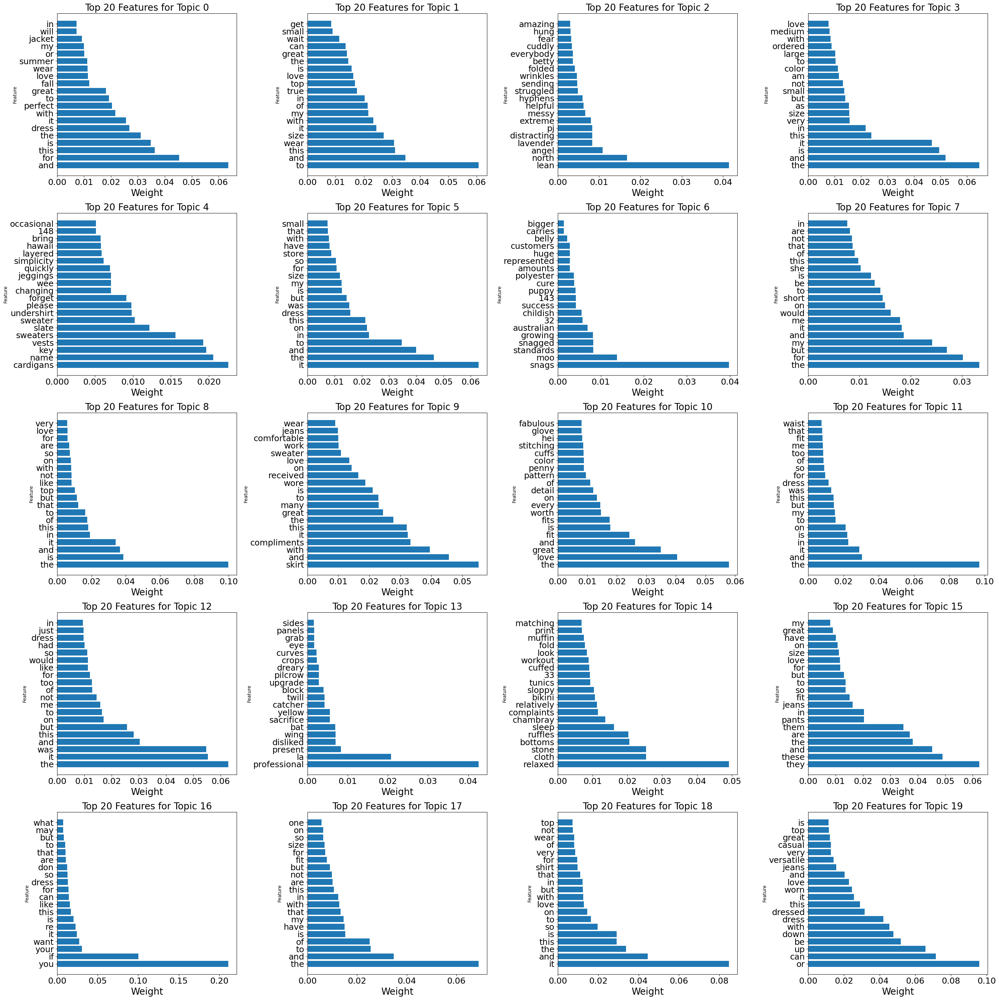

In [55]:
lda_review = LatentDirichletAllocation(n_components=20, learning_decay=0.01, batch_size=64)
lda_review.fit(vector_review )
review_features = vectorizer2.get_feature_names_out()
topic_word_distributions = lda_review.components_ / lda_review.components_.sum(axis=1)[:, np.newaxis]
n_top_words = 20  
n_rows = 5  
n_cols = 4  

fig, axes = plt.subplots(n_rows, n_cols, figsize=(30, 30))
for topic_idx, (topic, ax) in enumerate(zip(topic_word_distributions, axes.flatten())):
    top_features_idx = topic.argsort()[::-1][:n_top_words]
    top_features = [review_features[i] for i in top_features_idx]
    top_weights = topic[top_features_idx]
    ax.barh(top_features, top_weights)
    ax.set_xlabel('Weight', fontsize=20)
    ax.set_ylabel('Feature')
    ax.set_title(f'Top {n_top_words} Features for Topic {topic_idx}',fontsize=20)
    ax.tick_params(axis='both', which='major', labelsize=18)
plt.tight_layout()
plt.show()

In [56]:
log_likelihood = lda_review.score(vector_review)

# Print the log likelihood
print("Log Likelihood:", log_likelihood)

Log Likelihood: -5219568.920797795


In [57]:
log_likelihood = lda_title.score(vector_title)

# Print the log likelihood
print("Log Likelihood:", log_likelihood)

Log Likelihood: -306952.5280291052


# Title and Review Text Concatination

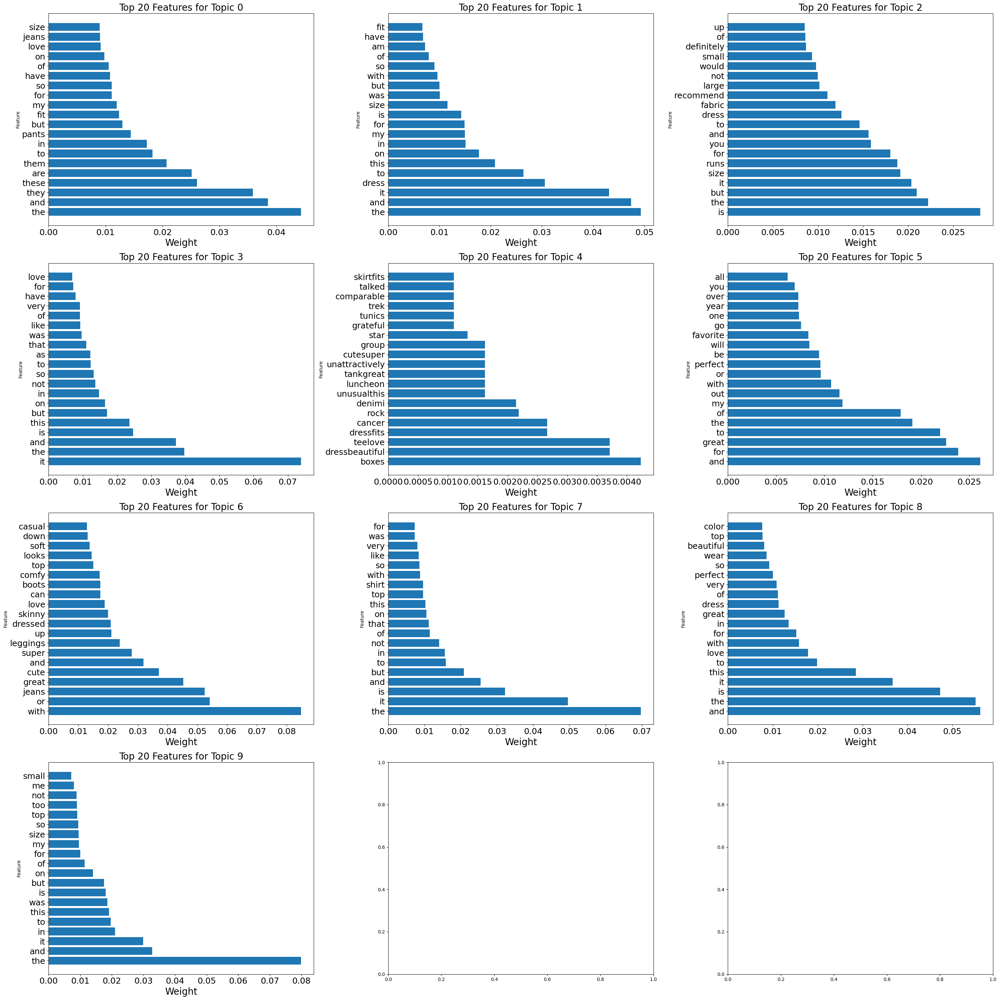

In [58]:
lda_title_review = LatentDirichletAllocation()
lda_title_review.fit(vector_title_review)
title_review_features = vectorizer3.get_feature_names_out()
topic_word_distributions = lda_title_review.components_ / lda_title_review.components_.sum(axis=1)[:, np.newaxis]
n_top_words = 20  
n_rows = 4  
n_cols = 3  

fig, axes = plt.subplots(n_rows, n_cols, figsize=(30, 30))
for topic_idx, (topic, ax) in enumerate(zip(topic_word_distributions, axes.flatten())):
    top_features_idx = topic.argsort()[::-1][:n_top_words]
    top_features = [title_review_features[i] for i in top_features_idx]
    top_weights = topic[top_features_idx]
    ax.barh(top_features, top_weights)
    ax.set_xlabel('Weight', fontsize=20)
    ax.set_ylabel('Feature')
    ax.set_title(f'Top {n_top_words} Features for Topic {topic_idx}',fontsize=20)
    ax.tick_params(axis='both', which='major', labelsize=18)
plt.tight_layout()
plt.show()

In [59]:
log_likelihood = lda_title_review.score(vector_title_review )

# Print the log likelihood
print("Log Likelihood:", log_likelihood)

Log Likelihood: -5544322.660514485


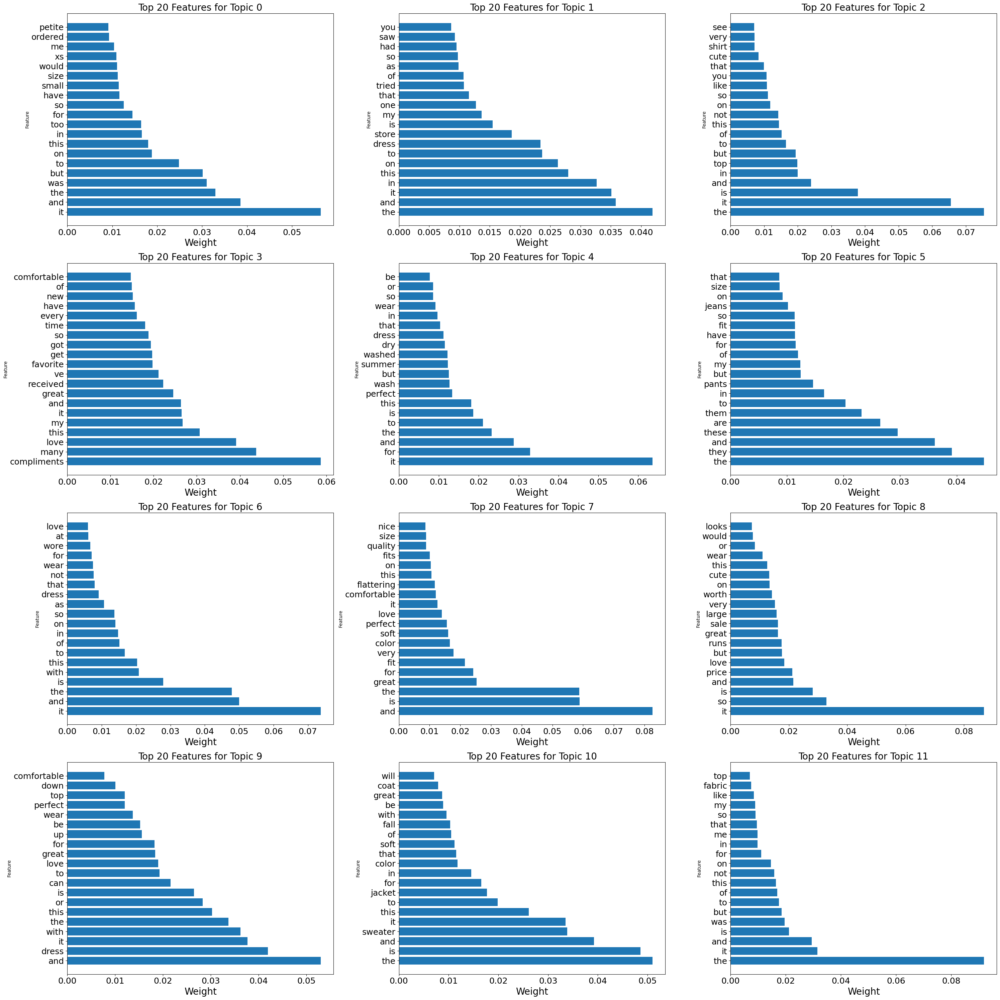

In [60]:
lda_title_review = LatentDirichletAllocation(n_components=20, learning_decay=0.01, batch_size=64)
lda_title_review.fit(vector_title_review)
title_review_features = vectorizer3.get_feature_names_out()
topic_word_distributions = lda_title_review.components_ / lda_title_review.components_.sum(axis=1)[:, np.newaxis]
n_top_words = 20  
n_rows = 4  
n_cols = 3  

fig, axes = plt.subplots(n_rows, n_cols, figsize=(30, 30))
for topic_idx, (topic, ax) in enumerate(zip(topic_word_distributions, axes.flatten())):
    top_features_idx = topic.argsort()[::-1][:n_top_words]
    top_features = [title_review_features[i] for i in top_features_idx]
    top_weights = topic[top_features_idx]
    ax.barh(top_features, top_weights)
    ax.set_xlabel('Weight', fontsize=20)
    ax.set_ylabel('Feature')
    ax.set_title(f'Top {n_top_words} Features for Topic {topic_idx}',fontsize=20)
    ax.tick_params(axis='both', which='major', labelsize=18)
plt.tight_layout()
plt.show()

In [61]:
log_likelihood = lda_title_review.score(vector_title_review )

# Print the log likelihood
print("Log Likelihood:", log_likelihood)

Log Likelihood: -5577747.344359003


# Vectorized Title and Review Concatinated

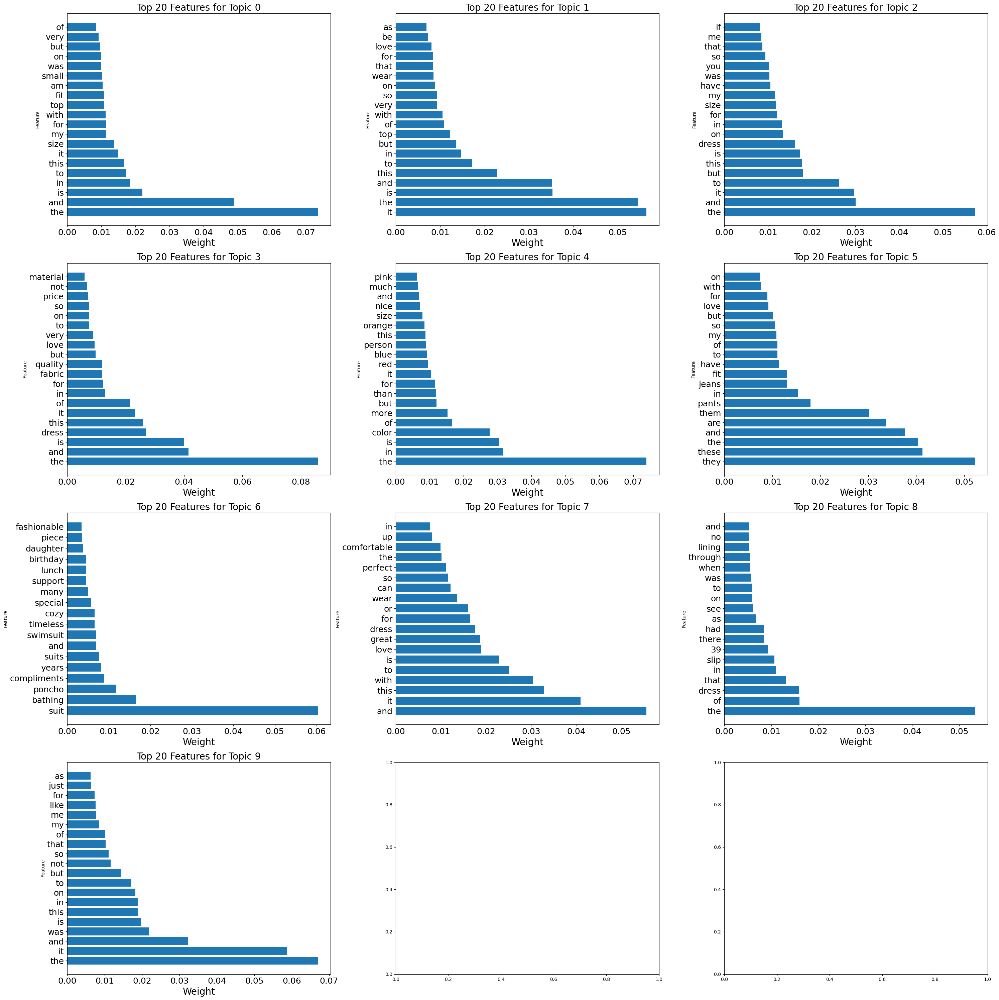

In [62]:
lda_vector_concatenated = LatentDirichletAllocation()
lda_vector_concatenated.fit(vector_concatenated)
vector_concatenated_features = np.concatenate([vectorizer1.get_feature_names_out(), vectorizer2.get_feature_names_out()])
topic_word_distributions = lda_vector_concatenated.components_ / lda_vector_concatenated.components_.sum(axis=1)[:, np.newaxis]
n_top_words = 20  
n_rows = 4  
n_cols = 3  

fig, axes = plt.subplots(n_rows, n_cols, figsize=(30, 30))
for topic_idx, (topic, ax) in enumerate(zip(topic_word_distributions, axes.flatten())):
    top_features_idx = topic.argsort()[::-1][:n_top_words]
    top_features = [vector_concatenated_features[i] for i in top_features_idx]
    top_weights = topic[top_features_idx]
    ax.barh(top_features, top_weights)
    ax.set_xlabel('Weight', fontsize=20)
    ax.set_ylabel('Feature')
    ax.set_title(f'Top {n_top_words} Features for Topic {topic_idx}',fontsize=20)
    ax.tick_params(axis='both', which='major', labelsize=18)
plt.tight_layout()
plt.show()

In [63]:
log_likelihood = lda_vector_concatenated.score(vector_concatenated)

# Print the log likelihood
print("Log Likelihood:", log_likelihood)

Log Likelihood: -5662400.250449158


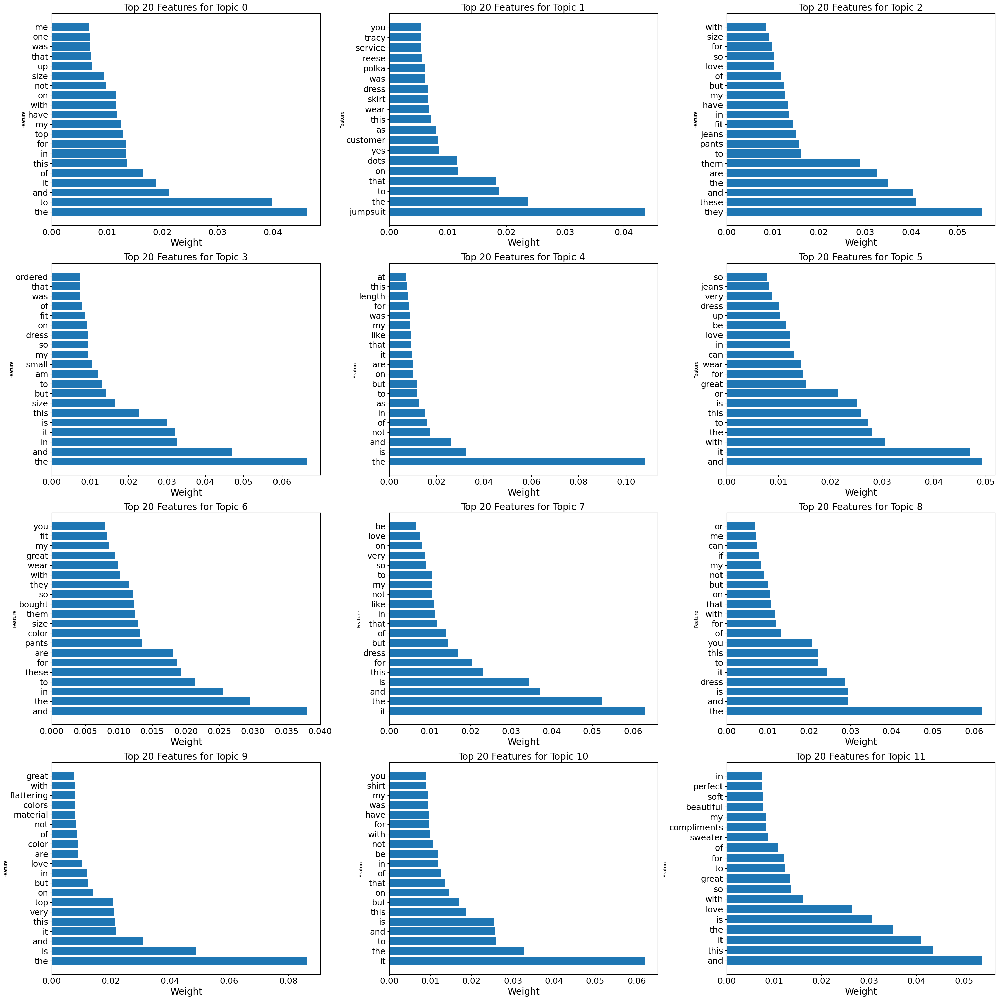

In [64]:
lda_vector_concatenated = LatentDirichletAllocation(n_components=20, learning_decay=0.01, batch_size=64)
lda_vector_concatenated.fit(vector_concatenated)
vector_concatenated_features = np.concatenate([vectorizer1.get_feature_names_out(), vectorizer2.get_feature_names_out()])
topic_word_distributions = lda_vector_concatenated.components_ / lda_vector_concatenated.components_.sum(axis=1)[:, np.newaxis]
n_top_words = 20  
n_rows = 4  
n_cols = 3  

fig, axes = plt.subplots(n_rows, n_cols, figsize=(30, 30))
for topic_idx, (topic, ax) in enumerate(zip(topic_word_distributions, axes.flatten())):
    top_features_idx = topic.argsort()[::-1][:n_top_words]
    top_features = [vector_concatenated_features[i] for i in top_features_idx]
    top_weights = topic[top_features_idx]
    ax.barh(top_features, top_weights)
    ax.set_xlabel('Weight', fontsize=20)
    ax.set_ylabel('Feature')
    ax.set_title(f'Top {n_top_words} Features for Topic {topic_idx}',fontsize=20)
    ax.tick_params(axis='both', which='major', labelsize=18)
plt.tight_layout()
plt.show()

In [65]:
log_likelihood = lda_vector_concatenated.score(vector_concatenated)

# Print the log likelihood
print("Log Likelihood:", log_likelihood)

Log Likelihood: -5698450.041352289


For this portion of the study, we assessed the four different models. I used the log likelihood to score the output, as this 
was the simplest method to implement. Of all the models. The Title Only model scored the best with a log likelihood of -306952.5280291052. The log likelihood indicates goodness of fit for the model, so title only seemed to have the best fit.

# Task 2 - Feature Tuning

## TfidfVectorizer instead of CountVectorizer. 

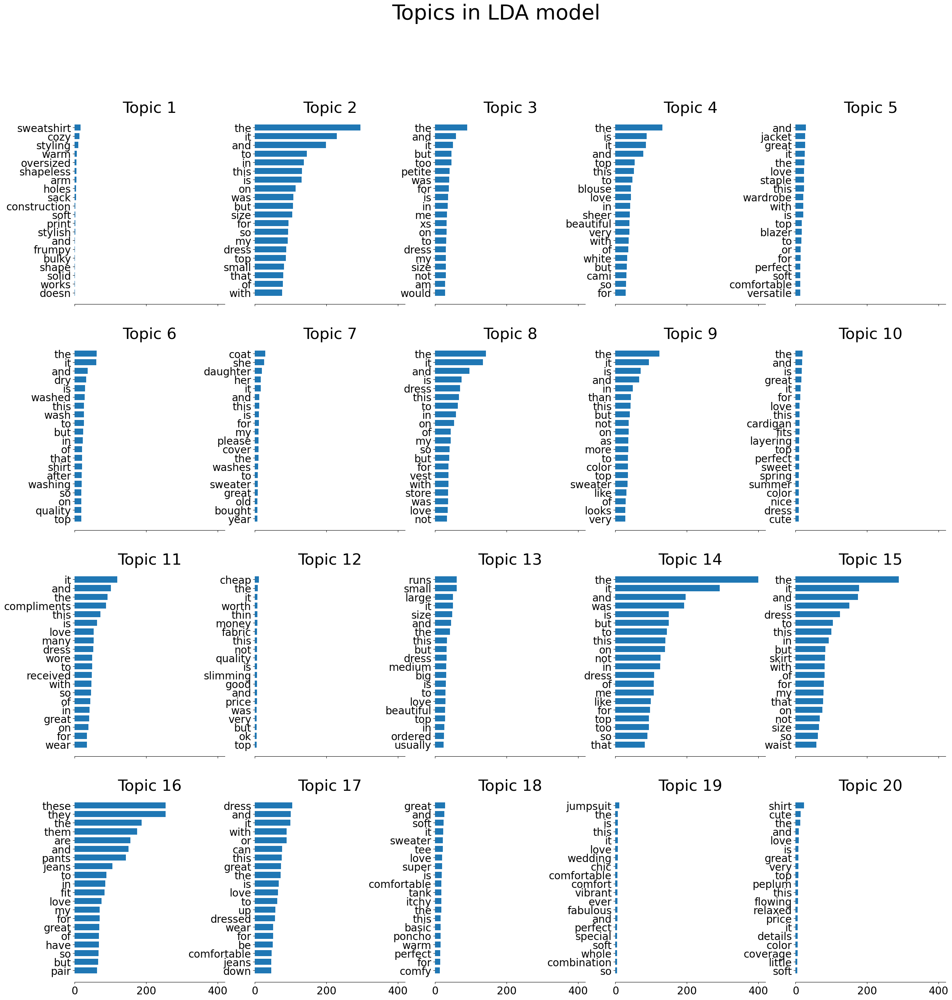

In [99]:
from sklearn.feature_extraction.text import TfidfVectorizer

partial_data['combined_text'] = partial_data['Title'] + " " + partial_data['Review']
vectorizer = TfidfVectorizer(max_features=1000)  
X = vectorizer.fit_transform(partial_data['combined_text'])

lda = LatentDirichletAllocation(n_components=20, random_state=42)  
lda.fit(X)

n_top_words = 20
feature_names = vectorizer.get_feature_names_out()
fig, axes = plt.subplots(4, 5, figsize=(30, 30), sharex=True)
axes = axes.flatten()
for topic_idx, topic in enumerate(lda.components_):
    top_features_ind = topic.argsort()[:-n_top_words - 1:-1]
    top_features = [feature_names[i] for i in top_features_ind]
    weights = topic[top_features_ind]

    ax = axes[topic_idx]
    ax.barh(top_features, weights, height=0.7)
    ax.set_title(f'Topic {topic_idx +1}', fontdict={'fontsize': 30})
    ax.invert_yaxis()
    ax.tick_params(axis='both', which='major', labelsize=20)
    for i in 'top right left'.split():
        ax.spines[i].set_visible(False)
fig.suptitle('Topics in LDA model', fontsize=40)
#plt.subplots_adjust(top=0.90, bottom=0.05, hspace=0.3)
plt.show()

In [67]:
log_likelihood = lda.score(X)

print("Log Likelihood:", log_likelihood)

Log Likelihood: -617827.4557406482


## TfidfVectorizer using normalization 

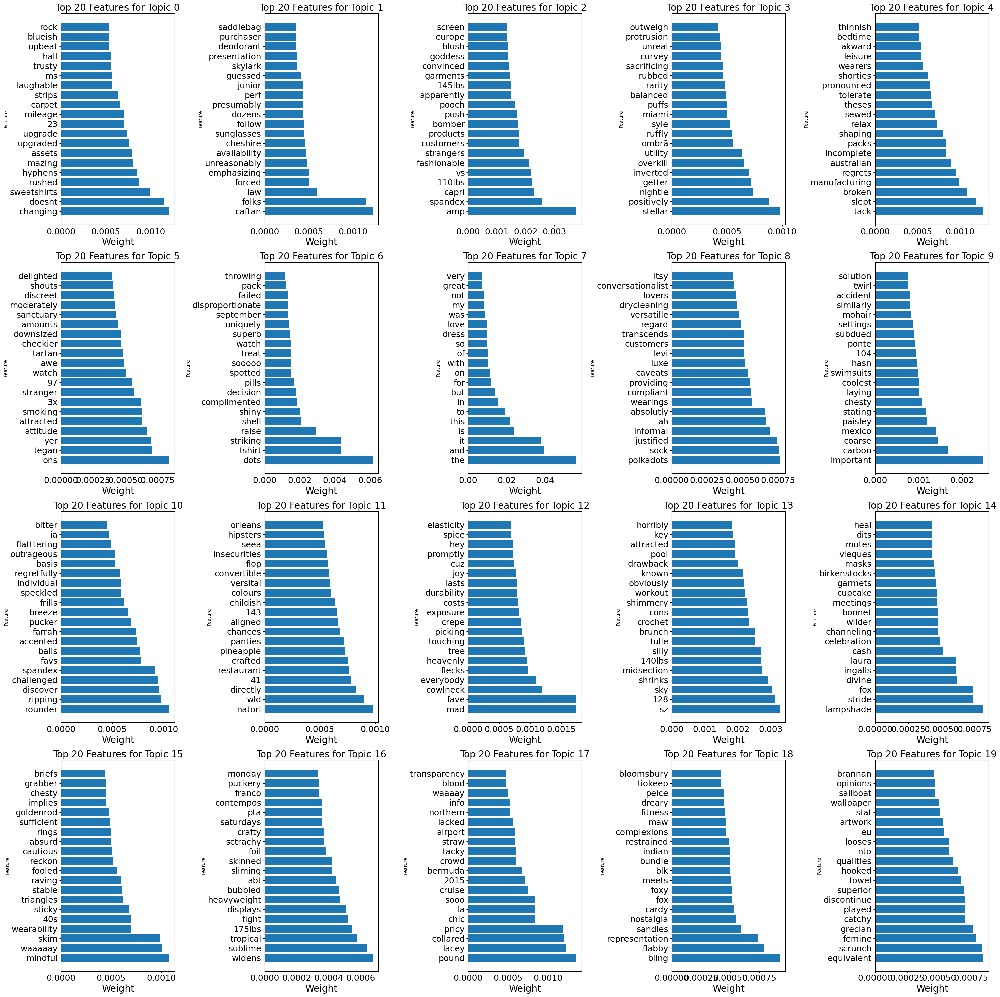

In [68]:
from sklearn.preprocessing import Normalizer
from sklearn.pipeline import make_pipeline

vectorizer3 = CountVectorizer()
normalizer = Normalizer()

pipeline = make_pipeline(vectorizer3, normalizer)
X_normalized = pipeline.fit_transform(partial_data['combined_text'])

lda_title_review = LatentDirichletAllocation(n_components=20)
lda_title_review.fit(X_normalized)

title_review_features = vectorizer3.get_feature_names_out()

topic_word_distributions = lda_title_review.components_ / lda_title_review.components_.sum(axis=1)[:, np.newaxis]

n_top_words = 20  
n_rows = 4  
n_cols = 5  

fig, axes = plt.subplots(n_rows, n_cols, figsize=(30, 30))
for topic_idx, (topic, ax) in enumerate(zip(topic_word_distributions, axes.flatten())):
    top_features_idx = topic.argsort()[::-1][:n_top_words]
    top_features = [title_review_features[i] for i in top_features_idx]
    top_weights = topic[top_features_idx]
    ax.barh(top_features, top_weights)
    ax.set_xlabel('Weight', fontsize=20)
    ax.set_ylabel('Feature')
    ax.set_title(f'Top {n_top_words} Features for Topic {topic_idx}', fontsize=20)
    ax.tick_params(axis='both', which='major', labelsize=18)
plt.tight_layout()
plt.show()


In [69]:
log_likelihood = lda_title_review.score(X_normalized)

# Print log likelihood
print("Log Likelihood:", log_likelihood)

Log Likelihood: -615632.1272606301


## Using stand stop-words

In [70]:
stop_words = set(stopwords.words('english'))
for column in ['Title', 'Review']:
    partial_data[column] = partial_data[column].apply(lambda x: ' '.join([word for word in word_tokenize(x) if word.lower() not in stop_words]))

Text(0.5, 0.98, 'Topics in LDA model')

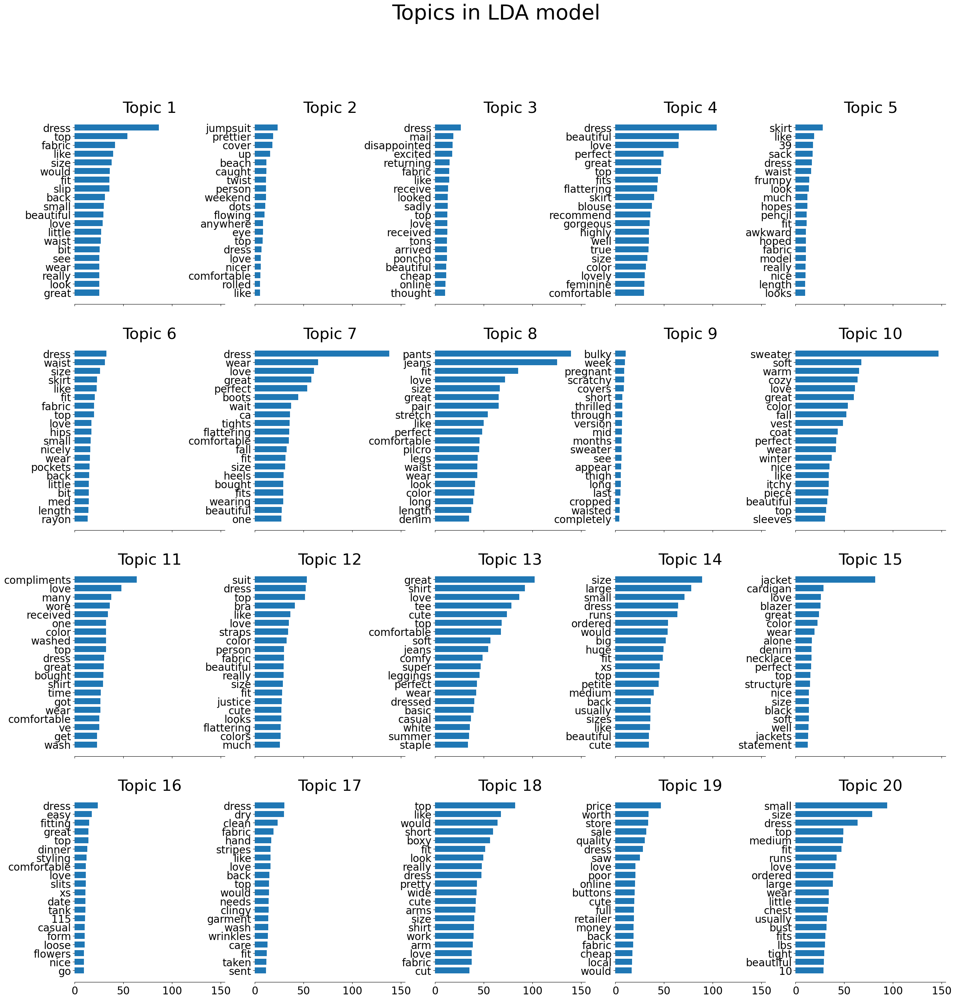

In [71]:
from sklearn.feature_extraction.text import TfidfVectorizer

partial_data['combined_text'] = partial_data['Title'] + " " + partial_data['Review']
vectorizer = TfidfVectorizer(max_features=1000)  
X = vectorizer.fit_transform(partial_data['combined_text'])

lda = LatentDirichletAllocation(n_components=20, random_state=42)  
lda.fit(X)

n_top_words = 20
feature_names = vectorizer.get_feature_names_out()
fig, axes = plt.subplots(4, 5, figsize=(30, 30), sharex=True)
axes = axes.flatten()
for topic_idx, topic in enumerate(lda.components_):
    top_features_ind = topic.argsort()[:-n_top_words - 1:-1]
    top_features = [feature_names[i] for i in top_features_ind]
    weights = topic[top_features_ind]

    ax = axes[topic_idx]
    ax.barh(top_features, weights, height=0.7)
    ax.set_title(f'Topic {topic_idx +1}', fontdict={'fontsize': 30})
    ax.invert_yaxis()
    ax.tick_params(axis='both', which='major', labelsize=20)
    for i in 'top right left'.split():
        ax.spines[i].set_visible(False)
fig.suptitle('Topics in LDA model', fontsize=40)

In [73]:
log_likelihood = lda.score(X)

# Print log likelihood
print("Log Likelihood:", log_likelihood)

Log Likelihood: -520706.9110275226


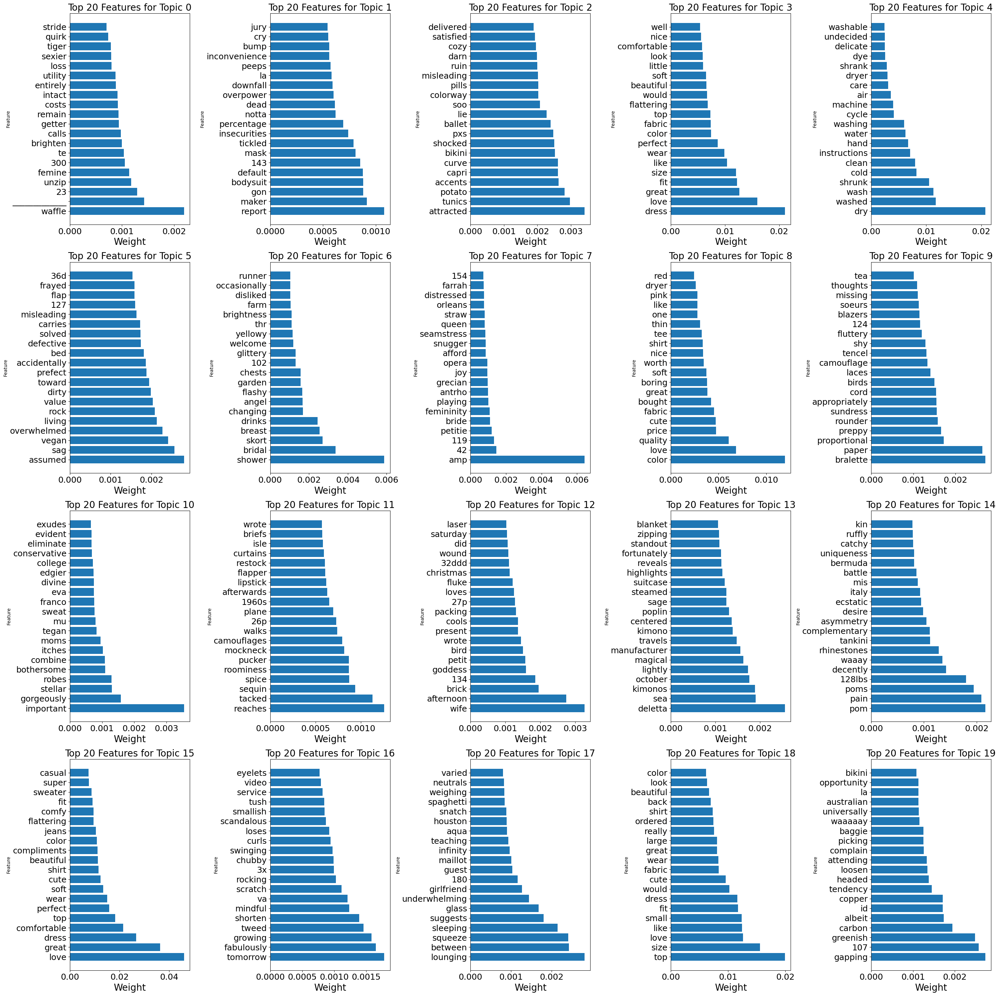

In [74]:
vectorizer3 = CountVectorizer()
normalizer = Normalizer()

pipeline = make_pipeline(vectorizer3, normalizer)
X_normalized = pipeline.fit_transform(partial_data['combined_text'])

lda_title_review = LatentDirichletAllocation(n_components=20)
lda_title_review.fit(X_normalized)

title_review_features = vectorizer3.get_feature_names_out()

topic_word_distributions = lda_title_review.components_ / lda_title_review.components_.sum(axis=1)[:, np.newaxis]

n_top_words = 20  
n_rows = 4  
n_cols = 5  

fig, axes = plt.subplots(n_rows, n_cols, figsize=(30, 30))
for topic_idx, (topic, ax) in enumerate(zip(topic_word_distributions, axes.flatten())):
    top_features_idx = topic.argsort()[::-1][:n_top_words]
    top_features = [title_review_features[i] for i in top_features_idx]
    top_weights = topic[top_features_idx]
    ax.barh(top_features, top_weights)
    ax.set_xlabel('Weight', fontsize=20)
    ax.set_ylabel('Feature')
    ax.set_title(f'Top {n_top_words} Features for Topic {topic_idx}', fontsize=20)
    ax.tick_params(axis='both', which='major', labelsize=18)
plt.tight_layout()
plt.show()

In [75]:
log_likelihood = lda_title_review.score(X_normalized)

print("Log Likelihood:", log_likelihood)

Log Likelihood: -625574.1908764375


Here we implemented TfidfVectorizer instead of CountVectorizer and then implemented stop-words. This change had a significant impact on the log likelihood score. All four models experienced and increate in log likelihood, which indicates that the model's goodness of fit deacreased.

## Limit the vocabulary using min_df or max_df.  

Log Likelihood: -178049.61542701517


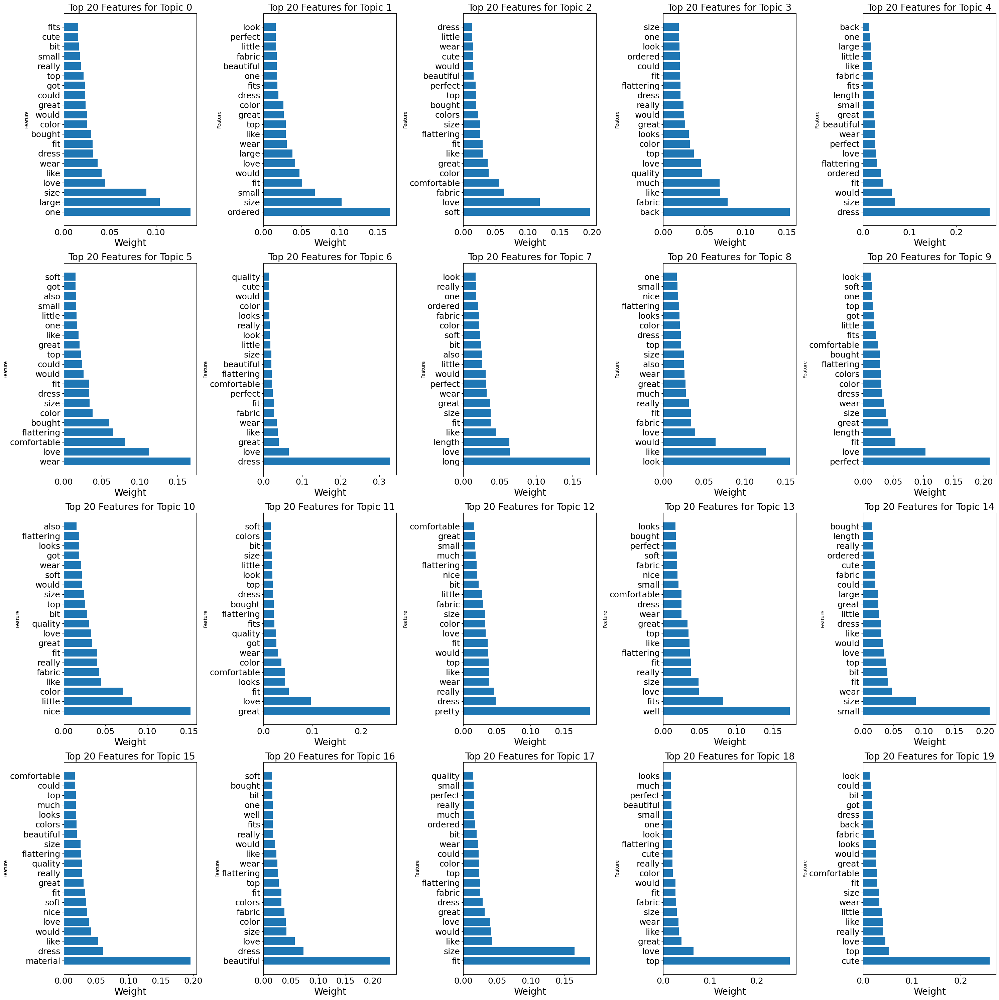

In [77]:
vectorizer3 = CountVectorizer(min_df=0.1, max_df=0.8)  # Adjust these values as needed

normalizer = Normalizer()

pipeline = make_pipeline(vectorizer3, normalizer)
X_normalized = pipeline.fit_transform(partial_data['combined_text'])

lda_title_review = LatentDirichletAllocation(n_components=20)
lda_title_review.fit(X_normalized)

log_likelihood = lda_title_review.score(X_normalized)
print("Log Likelihood:", log_likelihood)

title_review_features = vectorizer3.get_feature_names_out()

topic_word_distributions = lda_title_review.components_ / lda_title_review.components_.sum(axis=1)[:, np.newaxis]

n_top_words = 20  
n_rows = 4  
n_cols = 5  

fig, axes = plt.subplots(n_rows, n_cols, figsize=(30, 30))
for topic_idx, (topic, ax) in enumerate(zip(topic_word_distributions, axes.flatten())):
    top_features_idx = topic.argsort()[::-1][:n_top_words]
    top_features = [title_review_features[i] for i in top_features_idx]
    top_weights = topic[top_features_idx]
    ax.barh(top_features, top_weights)
    ax.set_xlabel('Weight', fontsize=20)
    ax.set_ylabel('Feature')
    ax.set_title(f'Top {n_top_words} Features for Topic {topic_idx}', fontsize=20)
    ax.tick_params(axis='both', which='major', labelsize=18)
plt.tight_layout()
plt.show()

Implementing min_df and max_df had significant impacts on the model's goodness of fit. This implemenation increased log-likelihood to -178,049, a massive increase in performance.

# Task 3 n-grams

Log Likelihood: -177735.38779850007


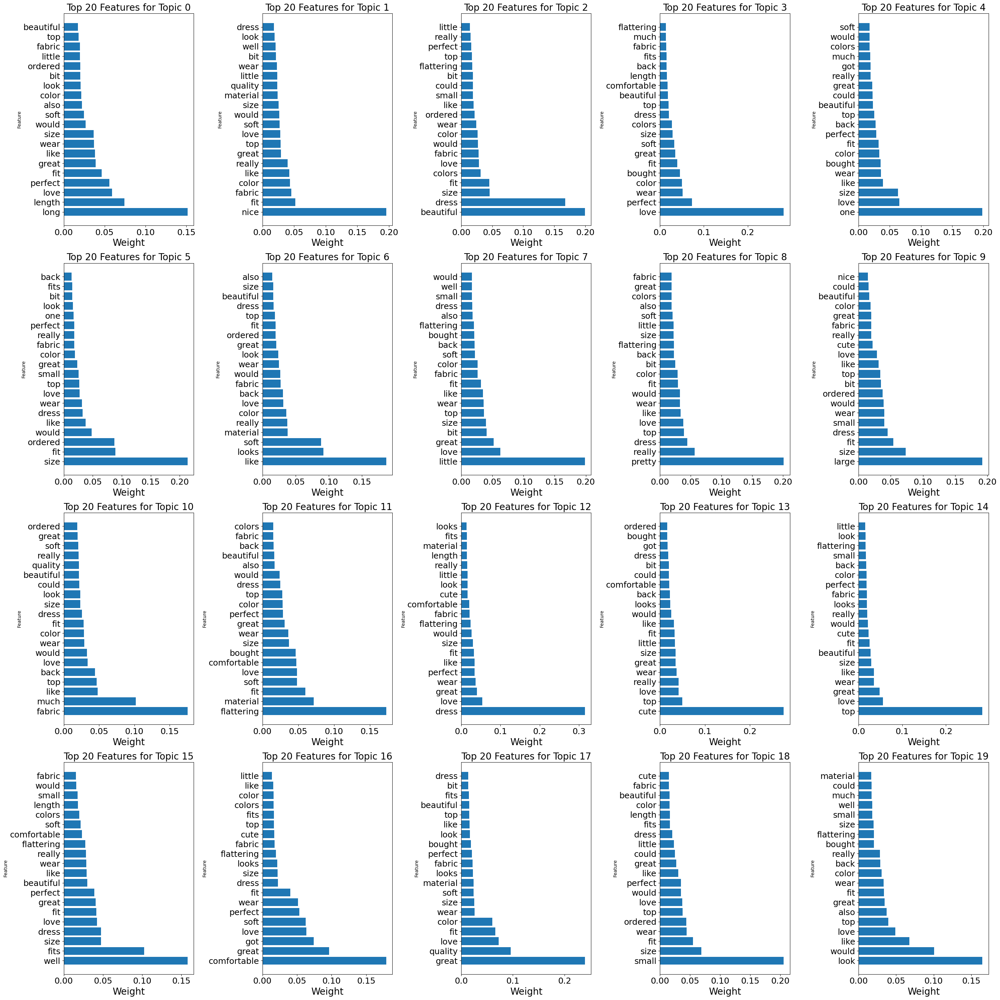

In [84]:
vectorizer3 = CountVectorizer(min_df=0.1, max_df=0.8, ngram_range=(-100,30))  

normalizer = Normalizer()

pipeline = make_pipeline(vectorizer3, normalizer)
X_normalized = pipeline.fit_transform(partial_data['combined_text'])

lda_title_review = LatentDirichletAllocation(n_components=20)
lda_title_review.fit(X_normalized)

log_likelihood = lda_title_review.score(X_normalized)
print("Log Likelihood:", log_likelihood)

title_review_features = vectorizer3.get_feature_names_out()

topic_word_distributions = lda_title_review.components_ / lda_title_review.components_.sum(axis=1)[:, np.newaxis]

n_top_words = 20  
n_rows = 4  
n_cols = 5  

fig, axes = plt.subplots(n_rows, n_cols, figsize=(30, 30))
for topic_idx, (topic, ax) in enumerate(zip(topic_word_distributions, axes.flatten())):
    top_features_idx = topic.argsort()[::-1][:n_top_words]
    top_features = [title_review_features[i] for i in top_features_idx]
    top_weights = topic[top_features_idx]
    ax.barh(top_features, top_weights)
    ax.set_xlabel('Weight', fontsize=20)
    ax.set_ylabel('Feature')
    ax.set_title(f'Top {n_top_words} Features for Topic {topic_idx}', fontsize=20)
    ax.tick_params(axis='both', which='major', labelsize=18)
plt.tight_layout()
plt.show()

Implementing numerical n-grams only had minimal impacts on the model's performance, where log likelihood had an increase of 1000 points. In the grand scheme of things, this increase is not significant.

## Use character n-grams

Log Likelihood: -110506.10129053402


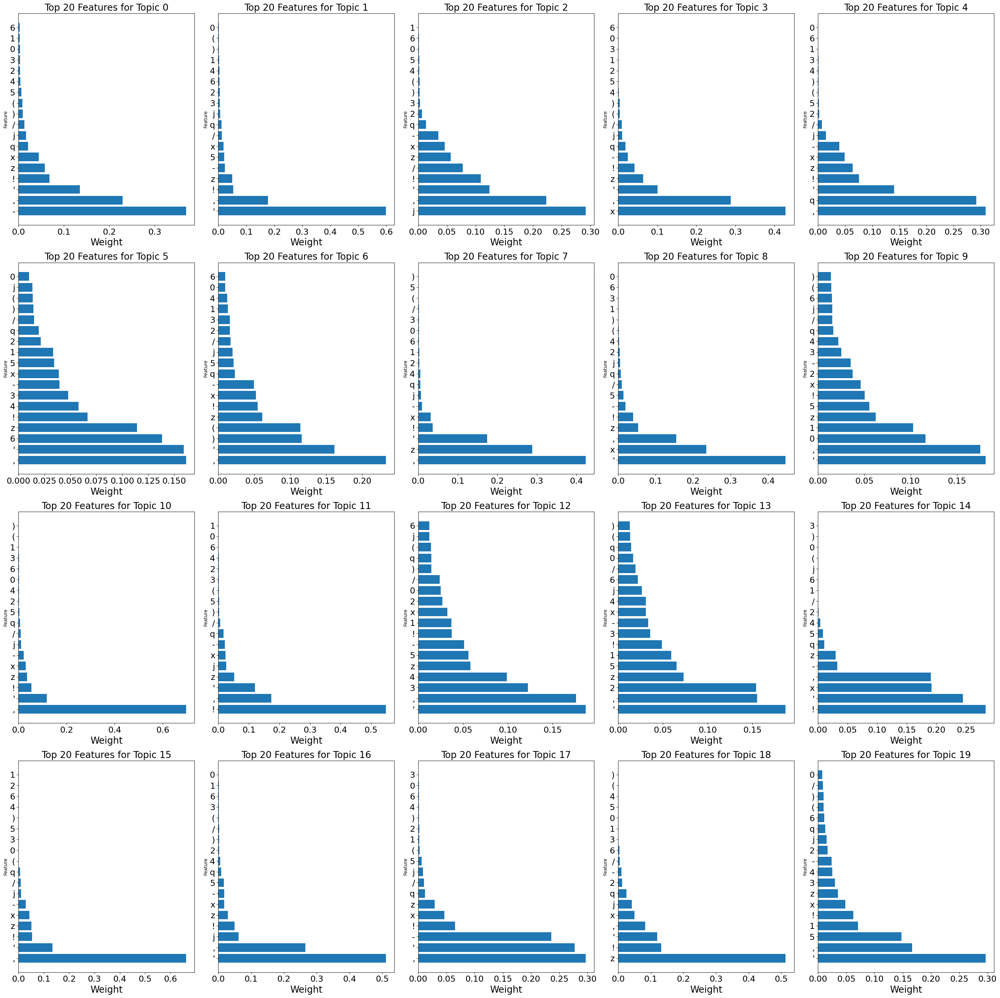

In [87]:
vectorizer3 = CountVectorizer(analyzer='char',min_df=0.1, max_df=0.8)  

normalizer = Normalizer()

pipeline = make_pipeline(vectorizer3, normalizer)
X_normalized = pipeline.fit_transform(partial_data['combined_text'])

lda_title_review = LatentDirichletAllocation(n_components=20)
lda_title_review.fit(X_normalized)

log_likelihood = lda_title_review.score(X_normalized)
print("Log Likelihood:", log_likelihood)

title_review_features = vectorizer3.get_feature_names_out()

topic_word_distributions = lda_title_review.components_ / lda_title_review.components_.sum(axis=1)[:, np.newaxis]

n_top_words = 20  
n_rows = 4  
n_cols = 5  

fig, axes = plt.subplots(n_rows, n_cols, figsize=(30, 30))
for topic_idx, (topic, ax) in enumerate(zip(topic_word_distributions, axes.flatten())):
    top_features_idx = topic.argsort()[::-1][:n_top_words]
    top_features = [title_review_features[i] for i in top_features_idx]
    top_weights = topic[top_features_idx]
    ax.barh(top_features, top_weights)
    ax.set_xlabel('Weight', fontsize=20)
    ax.set_ylabel('Feature')
    ax.set_title(f'Top {n_top_words} Features for Topic {topic_idx}', fontsize=20)
    ax.tick_params(axis='both', which='major', labelsize=18)
plt.tight_layout()
plt.show()

Using character n-grams saw another increase in log likelihood, increasing the metric to ~110K. This represents the most performant model in this study.

## Investigate how min_df and the use of stop-words changes the number of features when using word n-grams, and how they change the score. 

Applying min_df and stop-word removal in text processing helps refine our data by removing less frequent words and insignificant terms. This serves to simplify the model by focusing on fewer but more impactful features. This improves the model's time complexity. Next, by hyper-tuning the parameters, the practitioner can enhance the model’s accuracy. Lastly, this will ensure that the models are performant and able to deliver accurate understanding and predictive abilities based on the textual data.

# Task 4 Model Tuning (again)

In [101]:
X = partial_data['combined_text'].copy()
y = full_data['Recommended'].copy()

In [105]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.pipeline import Pipeline

X = partial_data['combined_text'].copy()
y = full_data['Recommended'].copy()  

pipeline = Pipeline([
    ('vectorizer', CountVectorizer(analyzer='char', min_df=0.1, max_df=0.8)),
    ('normalizer', Normalizer()),
    ('clf', LogisticRegression(solver='liblinear'))  
])

param_grid = {
    'clf__penalty': ['l1', 'l2'],
    'clf__C': [0.01, 0.1, 1, 10, 100]  
}


grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='accuracy', verbose=1)


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


grid_search.fit(X_train, y_train)


print("Best parameters:", grid_search.best_params_)
print("Best cross-validation score: {:.2f}".format(grid_search.best_score_))

print("L2 Penalty Accuracy: %0.2f (+/- %0.2f)" % (scores_l2.mean(), scores_l2.std() * 2))

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best parameters: {'clf__C': 100, 'clf__penalty': 'l1'}
Best cross-validation score: 0.82
L2 Penalty Accuracy: 0.82 (+/- 0.00)


For the final portion of this study, I implemented a L1 and L2 logistic regression models an

In [106]:

best_params = grid_search.best_params_

final_model = LogisticRegression(
    penalty=best_params['clf__penalty'],
    C=best_params['clf__C'],
    solver='liblinear'
)


final_pipeline = Pipeline([
    ('vectorizer', CountVectorizer(analyzer='char', min_df=0.1, max_df=0.8)),
    ('normalizer', Normalizer()),
    ('clf', final_model)
])


final_pipeline.fit(X_train, y_train)


final_score = final_pipeline.score(X_test, y_test)
print("Final model accuracy on the test set: {:.2f}".format(final_score))


Final model accuracy on the test set: 0.82


In [107]:
from sklearn.metrics import roc_curve, auc, classification_report, confusion_matrix
import seaborn as sns  

In [108]:
y_prob = final_pipeline.predict_proba(X_test)[:, 1]  # Probability estimates for the positive class

y_pred = final_pipeline.predict(X_test)

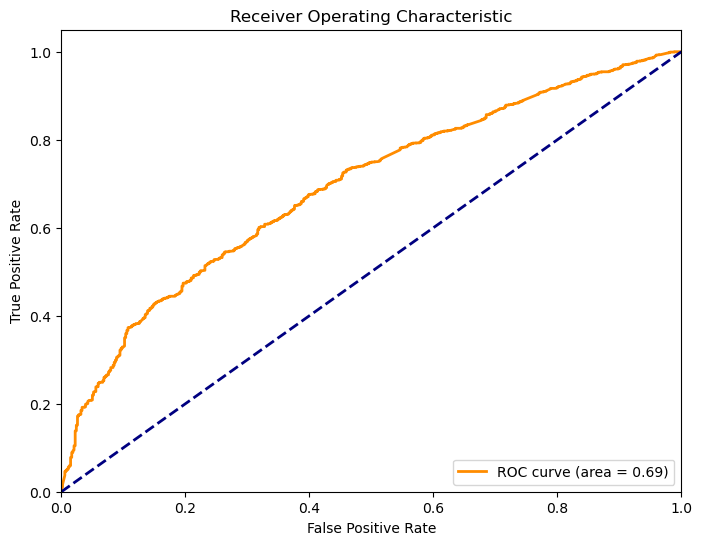

In [109]:
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

In [110]:
print(classification_report(y_test, y_pred, target_names=['Not Recommended', 'Recommended']))

                 precision    recall  f1-score   support

Not Recommended       1.00      0.00      0.01       540
    Recommended       0.82      1.00      0.90      2413

       accuracy                           0.82      2953
      macro avg       0.91      0.50      0.45      2953
   weighted avg       0.85      0.82      0.74      2953



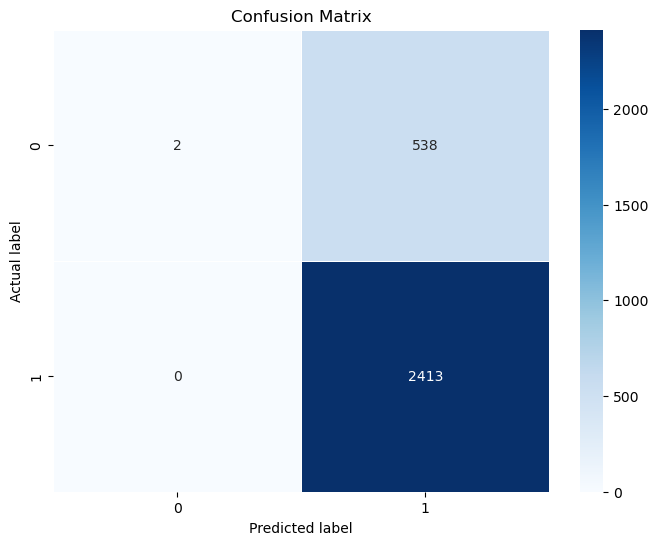

In [111]:
cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", linewidths=.5, cmap="Blues")
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title('Confusion Matrix')
plt.show()

Lastly, L1 and L2 logistic regression is implemented with not so good results. The model is 100% at predicted recommended, but nearly 0% at predicting not recommended. This was a good exercise for training, however in a professional setting, this study would need to be completely blown up and repeated.